### Data Preparation

We first import the necessary utils and fetch the data we are working with.

In [12]:
from google.colab import files

uploaded = files.upload()

Saving intro.wav to intro.wav


In [2]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.2.1+cu121
2.2.1+cu121
cuda


In [15]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset

# download wav form of the audio
AUDIO_FILE = 'intro.wav'

### Create Pipeline
We use a pretrained Wav2Vec2 model.

In [4]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)
print("Labels:", bundle.get_labels()) # output class labels

# fetch pretrained weights and load it to model
model = bundle.get_model().to(device)
print(model.__class__)

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


Downloading: "https://download.pytorch.org/torchaudio/models/wav2vec2_fairseq_base_ls960_asr_ls960.pth" to /root/.cache/torch/hub/checkpoints/wav2vec2_fairseq_base_ls960_asr_ls960.pth
100%|██████████| 360M/360M [00:05<00:00, 65.7MB/s]


<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


### Loading data

In [16]:
IPython.display.Audio(AUDIO_FILE)

In [18]:
waveform, sample_rate = torchaudio.load(AUDIO_FILE) # load data
waveform = waveform.to(device) # move to the same device

# sample rates have to be the same for decoding purposes, if not, we resample
if sample_rate != bundle.sample_rate:
  waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

### Extracting acoustic features

In [19]:
with torch.inference_mode():
  features, _ = model.extract_features(waveform)

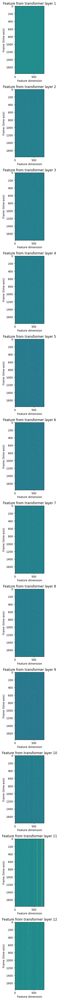

In [20]:
# extracted features is a list of tensors
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

### Feature classification

In [21]:
# feature extraction and classification
with torch.inference_mode():
  emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


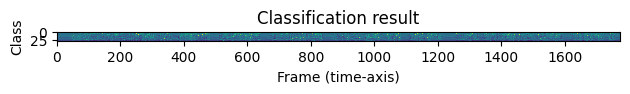

In [22]:
# output is in the form of logits, not probability
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

### Generating Transcripts

In [23]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])


decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

print(transcript)
IPython.display.Audio(AUDIO_FILE)


HULLO|MADAM'S|TAISY|A|STUDY|COMPURE|SCIENCE|AT|THE|UNIVERSITY|OF|WATERLOO|AND|BUSINESS|AT|WOFRILORIE|UNIVERSITY|I|AM|COLONELLY|AWITH|YOUR|DOUBLE|DEGREE|STUDENT|AND|I|HAVE|BEEN|BEING|A|LOT|OF|INTRANSHIPS|IN|CONSULTING|BANKING|SELFWENSIONEERING|SERVACE|COMPUTING|AND|ARTIFICIAL|INTELLIGENCE|RELITOUS|TOV|I|AM|RECORDING|THUS|TO|SERVE|AS|A|TASTARIO|FOR|MY|PROJECT|TO|TROSCRIBE|EIHTISIARIA|TUTEXT|AND|I|HOPE|THE|RESULTS|CANT|TURN|OUN|NICE|THANK|YOU|
